In [35]:
import matplotlib.pyplot as plt
import japanize_matplotlib
import numpy as np
from pathlib import Path
from PIL import Image
import cv2
import omegaconf


In [24]:
dir = Path('/home/koki/workspace/master_thesis/commonroad_sim') / "results" / "metrics" / "tmp"
time_steps = range(100)
items = []
for timestep in time_steps:
    filename = dir / f"results_{timestep:03d}.npy"
    item = np.load(filename, allow_pickle=True).item()
    items.append(item)

In [25]:
print(len((items[0]['results'][0])))

20


In [26]:
# result: np.ndarray (timeseq, agent_acc, phantom_vel, phantom_acc, metric)
# metric: (dce, ttc, ttce)

len_time_steps = len(items)
len_agent_acc = len(items[0]['agent_accs'])
len_phantom_vel = len(items[0]['phantom_vels'])
len_phantom_acc = len(items[0]['phantom_accs'])
len_metric = 3

result = np.zeros((len_time_steps, len_agent_acc, len_phantom_vel, len_phantom_acc, len_metric))
for i, item in enumerate(items):
    for j, agent_acc in enumerate(item['agent_accs']):
        for k, phantom_vel in enumerate(item['phantom_vels']):
            for l, phantom_acc in enumerate(item['phantom_accs']):
                for key, value in item['results'][j][k][l].items():
                    # print(key, value)
                    if key == 'dce':
                        result[i, j, k, l, 0] = value
                    elif key == 'ttc':
                        result[i, j, k, l, 1] = value
                    elif key == 'ttce':
                        result[i, j, k, l, 2] = value

In [27]:
dce = result[:, :, :, :, 0]
ttc = result[:, :, :, :, 1]
ttce = result[:, :, :, :, 2]

# DCE is distance to Closest Encounter

# TTC is Time to Collision
ttc_threshold = 2.0 # [s]
alpha = 2.0 
risk_of_ttc = 1.0 / (1.0 + np.exp(alpha * (ttc - ttc_threshold)))
risk_of_ttc_mean = np.mean(risk_of_ttc, axis=1)
risk_of_ttc_mean.shape

(100, 20, 20)

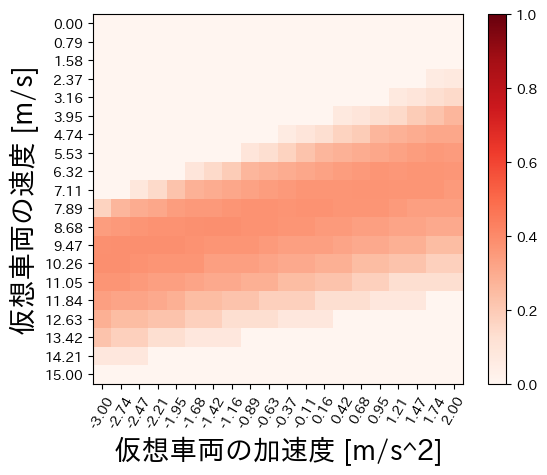

In [ ]:
timestep = 20
step = risk_of_ttc_mean[20]
distance_of_agent = 46.5 - timestep * 0.05 * 8.0
plt.figure()
im = plt.imshow(step, interpolation='nearest', cmap=plt.cm.Reds, vmin=0, vmax=1)
plt.colorbar(im)
plt.xlabel('仮想車両の加速度 [m/s^2]', fontsize=20)
plt.xticks(range(len_phantom_acc), [f"{val:.2f}" for val in item['phantom_accs']], rotation=60)
plt.yticks(range(len_phantom_vel), [f"{val:.2f}" for val in item['phantom_vels']])
plt.ylabel('仮想車両の速度 [m/s]', fontsize=20)
# plt.colorbar()
# plt.savefig(f"risk/risk_{timestep:03d}.png")
plt.show()
# print(step)

In [31]:
for timestep in range(len_time_steps):
    step = risk_of_ttc_mean[timestep]
    distance_of_agent = 46.5 - timestep * 0.05 * 8.0
    plt.figure()
    im = plt.imshow(step, interpolation='nearest', cmap=plt.cm.Reds, vmin=0, vmax=1)
    plt.colorbar(im)
    plt.xlabel('Phantom Acceleration [m/s^2]', fontsize=24)
    plt.xticks(range(len_phantom_acc), [f"{val:.2f}" for val in item['phantom_accs']], rotation=60)
    plt.yticks(range(len_phantom_vel), [f"{val:.2f}" for val in item['phantom_vels']])
    plt.ylabel('Phantom Velocity [m/s]', fontsize=24)
    plt.title(f'heatmap of risk at time step {timestep}\n distace of agent {distance_of_agent:.2f} [m]')
    # plt.colorbar()
    plt.savefig(f"risk/risk_{timestep:03d}.png")
    plt.close()
    # plt.show()

img = cv2.imread('risk/risk_000.png')
height, width, _ = img.shape
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # .mp4用
video_writer = cv2.VideoWriter('risk.mp4', fourcc, 20, (width, height))

for timestep in range(len_time_steps):
    img = cv2.imread(f'risk/risk_{timestep:03d}.png')
    video_writer.write(img)

video_writer.release()


In [ ]:


# # calc exp(-ttc/sigma) for each time step
# sigma = 2.5
# risk = np.exp(-result[:, :, :, :, 1] / sigma)
# print(result[20, 5, :, :, 0])
# print(risk.shape)
# # calc weighted sum of risk od agent_acc (in this case, weight is equal)
# result_v_a = np.sum(risk, axis=1)
# print(result_v_a.shape)

# # higher risk, lower possibility to exist
# # リスクの許容度 sigma
# sigma = 5
# p_v_a = np.exp(-result_v_a / sigma)

# logisitic function risk
alpha = 5.0
tau = 3.0
# risk = 1 / (1 + np.exp(alpha * (result[:, :, :, :, 1] - tau)))
risk = 1 / (1 + np.exp(alpha * (result[:, :, :, :, 2] - tau)))
# print(risk[0, :, :, :])
risk = np.sum(risk, axis=1)
sigma = 5
p_v_a = np.exp(-risk / sigma)

for i in range(result.shape[0]):
    if np.all(result[i, :, :, :, 2] == 0): continue
    print(result[i, :, :, :, 2])
    break

# print(result[i, :, :, :, 2])



In [23]:
risk[0, :, :]

array([[19.6402758, 19.6402758, 19.6402758, 19.6402758, 19.6402758,
        19.6402758, 19.6402758, 19.6402758, 19.6402758, 19.6402758,
        19.6402758, 19.6402758, 19.6402758, 19.6402758, 19.6402758,
        19.6402758, 19.6402758, 19.6402758, 19.6402758, 19.6402758],
       [19.6402758, 19.6402758, 19.6402758, 19.6402758, 19.6402758,
        19.6402758, 19.6402758, 19.6402758, 19.6402758, 19.6402758,
        19.6402758, 19.6402758, 19.6402758, 19.6402758, 19.6402758,
        19.6402758, 19.6402758, 19.6402758, 19.6402758, 19.6402758],
       [19.6402758, 19.6402758, 19.6402758, 19.6402758, 19.6402758,
        19.6402758, 19.6402758, 19.6402758, 19.6402758, 19.6402758,
        19.6402758, 19.6402758, 19.6402758, 19.6402758, 19.6402758,
        19.6402758, 19.6402758, 19.6402758, 19.6402758, 19.6402758],
       [19.6402758, 19.6402758, 19.6402758, 19.6402758, 19.6402758,
        19.6402758, 19.6402758, 19.6402758, 19.6402758, 19.6402758,
        19.6402758, 19.6402758, 19.6402758, 1

[[19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758]
 [19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758]
 [19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758]
 [19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758]
 [19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.

/tmp/ipykernel_78679/1769923914.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


[[19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758]
 [19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758]
 [19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758]
 [19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.6402758]
 [19.6402758 19.6402758 19.6402758 19.6402758 19.6402758 19.6402758
  19.6402758 19.

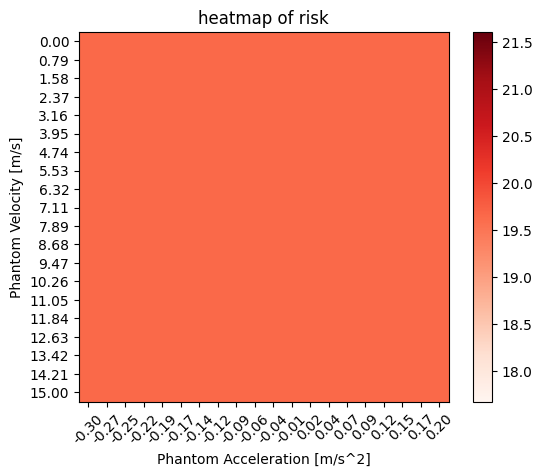

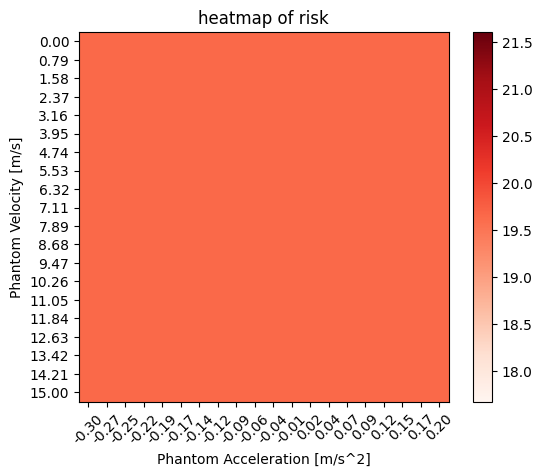

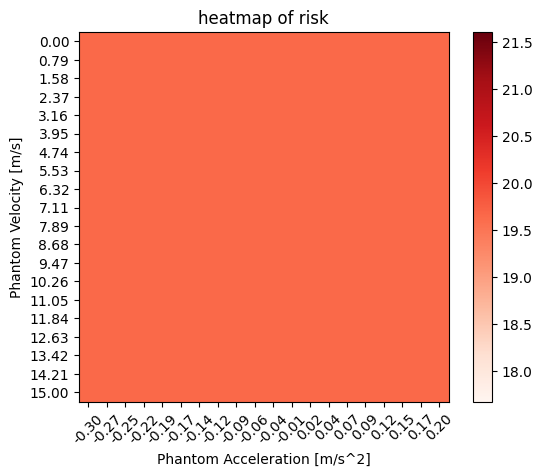

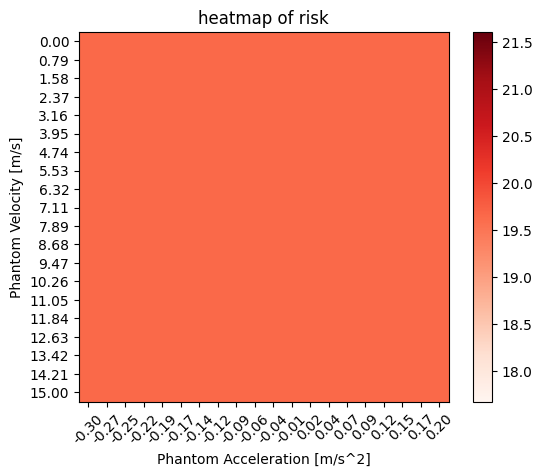

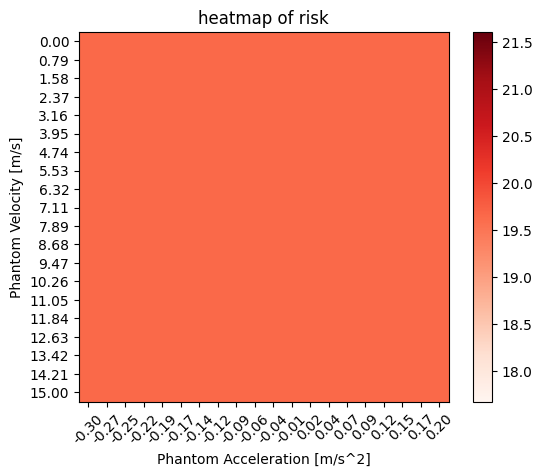

...

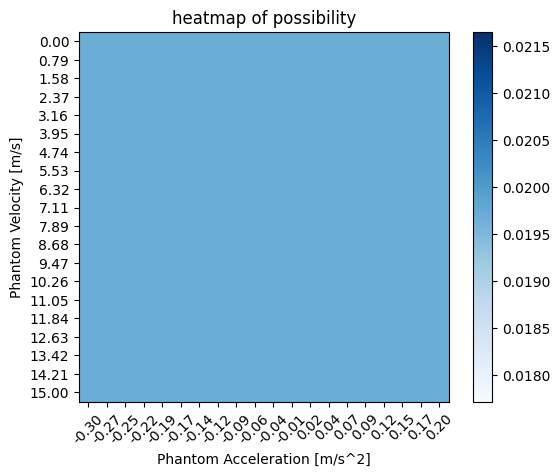

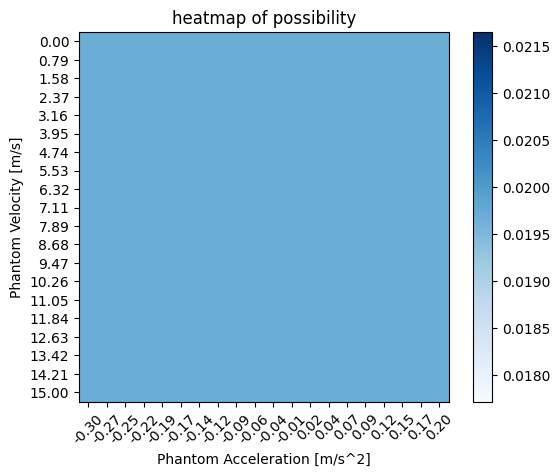

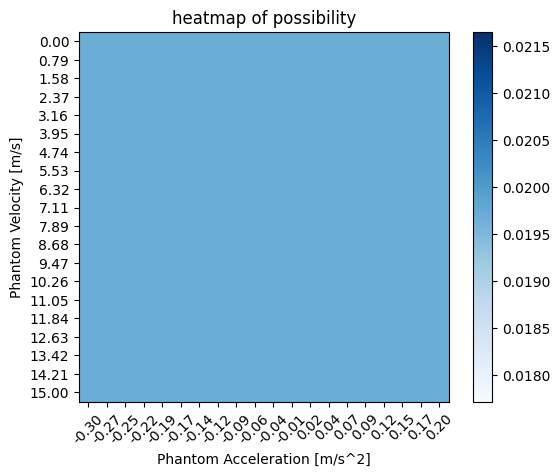

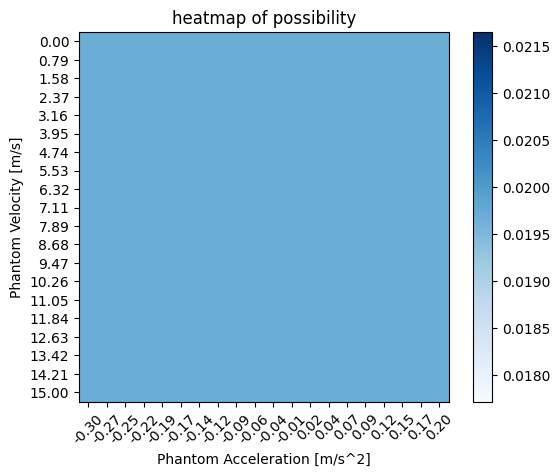

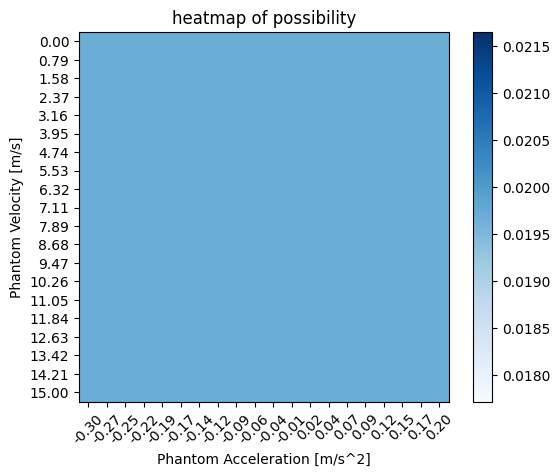

In [26]:
# plot result of heatmap
for timestep in range(len_time_steps):
    step = risk[timestep]
    # normalize
    # sum = np.sum(step)
    # step = step / sum
    # print(np.sum(step))
    # import sys; sys.exit()
    plt.figure()
    im = plt.imshow(step, interpolation='nearest', cmap=plt.cm.Reds)
    plt.colorbar(im)
    plt.xlabel('Phantom Acceleration [m/s^2]')
    plt.xticks(range(len_phantom_acc), [f"{val:.2f}" for val in item['phantom_accs']], rotation=45)
    plt.yticks(range(len_phantom_vel), [f"{val:.2f}" for val in item['phantom_vels']])
    plt.ylabel('Phantom Velocity [m/s]')
    plt.title('heatmap of risk')
    # plt.colorbar()
    plt.savefig(f"risk/risk_{timestep:03d}.png")
    print(step)


for timestep in range(len_time_steps):
    step = p_v_a[timestep]
    # sum = np.sum(step)
    # step = step / sum
    plt.figure()
    im = plt.imshow(step, interpolation='nearest', cmap=plt.cm.Blues)
    plt.colorbar(im)
    plt.xlabel('Phantom Acceleration [m/s^2]')
    plt.xticks(range(len_phantom_acc), [f"{val:.2f}" for val in item['phantom_accs']], rotation=45)
    plt.yticks(range(len_phantom_vel), [f"{val:.2f}" for val in item['phantom_vels']])
    plt.ylabel('Phantom Velocity [m/s]')
    plt.title('heatmap of possibility')
    # plt.colorbar()
    plt.savefig(f"possible/possible_{timestep:03d}.png")
    print(step)

In [27]:
from PIL import Image

images = [Image.open(f"risk/risk_{timestep:03d}.png") for timestep in range(len_time_steps)]
images[0].save('risk.gif', save_all=True, append_images=images[1:], loop=0, duration=100)

images = [Image.open(f"possible/possible_{timestep:03d}.png") for timestep in range(len_time_steps)]
images[0].save('possible.gif', save_all=True, append_images=images[1:], loop=0, duration=100)

Text(0.5, 1.0, 'risk = 1 / (1 + exp(alpha * (TTC - tau))')

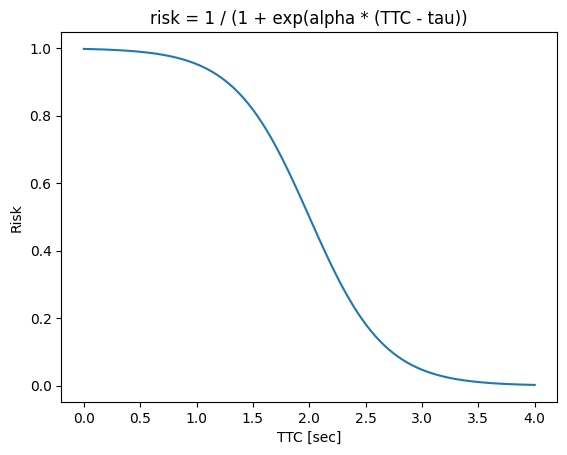

In [64]:


# plot simple sigmoid function
x = np.linspace(0, 4, 100)
alpha = 3.0
tau = 2.0
y = 1 / (1 + np.exp(alpha * (x - tau)))
plt.plot(x, y)
plt.xlabel('TTC [sec]')
plt.ylabel('Risk')
plt.title('risk = 1 / (1 + exp(alpha * (TTC - tau))')